In [1]:
import pandas as pd

file_path = 'T_ONTIME_REPORTING.xlsx'

df = pd.read_excel(file_path)


In [2]:
print(df.head())

   YEAR  MONTH  DAY_OF_MONTH  DAY_OF_WEEK               FL_DATE TAIL_NUM  \
0  2024      1             1            1  1/1/2024 12:00:00 AM    190NV   
1  2024      1             1            1  1/1/2024 12:00:00 AM    190NV   
2  2024      1             1            1  1/1/2024 12:00:00 AM    190NV   
3  2024      1             1            1  1/1/2024 12:00:00 AM    190NV   
4  2024      1             1            1  1/1/2024 12:00:00 AM    191NV   

   OP_CARRIER_FL_NUM  ORIGIN_AIRPORT_ID  ORIGIN_AIRPORT_SEQ_ID  \
0               1852              10431                1043106   
1                228              10431                1043106   
2                241              14112                1411206   
3                259              11697                1169706   
4               1074              14783                1478302   

   ORIGIN_CITY_MARKET_ID  ... ARR_TIME_BLK  CANCELLED  CANCELLATION_CODE  \
0                  30431  ...    1900-1959        0.0                N

In [6]:
import openpyxl
import plotly.graph_objects as go
import numpy as np
import scipy.stats as stats
from tqdm import tqdm
from scipy.stats import uniform,norm

In [13]:
values = df['AIR_TIME']
print(values)

0          74.0
1          95.0
2          75.0
3          93.0
4         101.0
          ...  
547266    144.0
547267    188.0
547268    159.0
547269    180.0
547270    175.0
Name: AIR_TIME, Length: 547271, dtype: float64


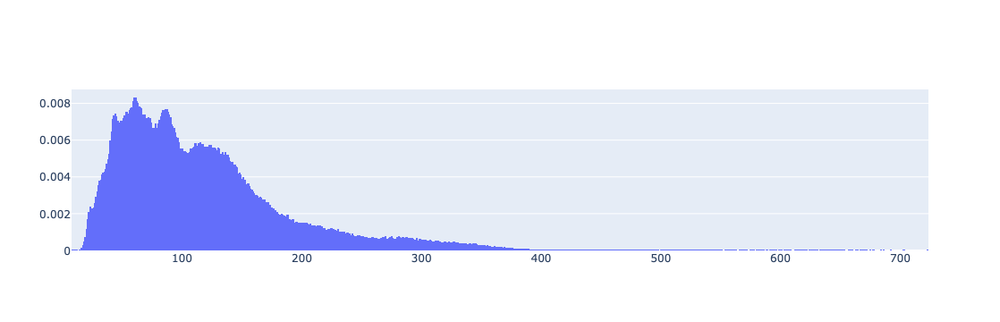

In [11]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=values, name=f'Наше распределени', opacity=1, nbinsx=1000, histnorm='probability density'))

In [15]:
airports = df['ORIGIN'].unique()
print(airports)

['AVL' 'PIE' 'FLL' 'SGF' 'IAG' 'SFB' 'FNT' 'PSC' 'GRI' 'AZA' 'BNA' 'SRQ'
 'GRR' 'PGD' 'TOL' 'TYS' 'LAS' 'FCA' 'SBN' 'CID' 'LEX' 'ABE' 'USA' 'MEM'
 'LRD' 'PBG' 'DSM' 'FWA' 'IND' 'PVU' 'SNA' 'ROA' 'FAR' 'BMI' 'BLV' 'RFD'
 'RAP' 'ICT' 'FSD' 'SYR' 'PIT' 'CVG' 'CKB' 'PSM' 'SPI' 'MSO' 'ALB' 'ATW'
 'OMA' 'PIA' 'LCK' 'XNA' 'RIC' 'BGR' 'BIS' 'OKC' 'BIL' 'IDA' 'MFE' 'PVD'
 'EUG' 'VPS' 'GEG' 'RNO' 'FAT' 'SCK' 'GFK' 'MOT' 'BZN' 'ELP' 'SMX' 'MDT'
 'BLI' 'MLI' 'DTW' 'PBI' 'SEA' 'DFW' 'SLC' 'BOS' 'DCA' 'SDF' 'JFK' 'LAX'
 'DEN' 'ATL' 'PHX' 'RDU' 'LGA' 'PDX' 'SFO' 'AUS' 'TUS' 'BUF' 'GSO' 'COS'
 'ORD' 'CLT' 'SAT' 'ORF' 'OAK' 'ILM' 'BWI' 'CHO' 'LIT' 'ONT' 'MSP' 'BFL'
 'SAN' 'PHL' 'GSP' 'BOI' 'SMF' 'XWA' 'PNS' 'OTH' 'MCO' 'RSW' 'JAX' 'TUL'
 'PSP' 'SJC' 'IAH' 'BUR' 'SBA' 'RDM' 'LGB' 'MCI' 'CHS' 'EWR' 'MIA' 'LIH'
 'EGE' 'MSY' 'GRB' 'ABQ' 'CLE' 'CMH' 'SJU' 'ANC' 'EYW' 'TPA' 'GTF' 'HSV'
 'ROC' 'BHM' 'SCE' 'DAY' 'ITH' 'ACV' 'MRY' 'STL' 'MAF' 'DRO' 'PWM' 'MKE'
 'SAV' 'MFR' 'SBP' 'JAC' 'HNL' 'SGU' 'BTM' 'GJT' 'H

In [19]:
airport_dict = {airport: None for airport in airports}

In [27]:
for airport in airports:
    count = df['ORIGIN'].value_counts()[airport]
    airport_dict[airport] = count

In [29]:
print(airport_dict)

{'AVL': 853, 'PIE': 580, 'FLL': 8460, 'SGF': 605, 'IAG': 38, 'SFB': 744, 'FNT': 159, 'PSC': 371, 'GRI': 81, 'AZA': 511, 'BNA': 7556, 'SRQ': 1585, 'GRR': 1569, 'PGD': 540, 'TOL': 38, 'TYS': 1117, 'LAS': 14942, 'FCA': 249, 'SBN': 507, 'CID': 586, 'LEX': 632, 'ABE': 349, 'USA': 68, 'MEM': 1673, 'LRD': 129, 'PBG': 40, 'DSM': 1252, 'FWA': 312, 'IND': 3552, 'PVU': 166, 'SNA': 3642, 'ROA': 256, 'FAR': 531, 'BMI': 143, 'BLV': 60, 'RFD': 65, 'RAP': 295, 'ICT': 748, 'FSD': 570, 'SYR': 1071, 'PIT': 3250, 'CVG': 3111, 'CKB': 15, 'PSM': 23, 'SPI': 12, 'MSO': 242, 'ALB': 863, 'ATW': 461, 'OMA': 1904, 'PIA': 284, 'LCK': 57, 'XNA': 979, 'RIC': 1332, 'BGR': 240, 'BIS': 277, 'OKC': 1732, 'BIL': 278, 'IDA': 228, 'MFE': 285, 'PVD': 968, 'EUG': 588, 'VPS': 553, 'GEG': 1288, 'RNO': 1545, 'FAT': 871, 'SCK': 39, 'GFK': 119, 'MOT': 189, 'BZN': 841, 'ELP': 1286, 'SMX': 9, 'MDT': 363, 'BLI': 204, 'MLI': 346, 'DTW': 9473, 'PBI': 2909, 'SEA': 11751, 'DFW': 23570, 'SLC': 9459, 'BOS': 10134, 'DCA': 11486, 'SDF': 175

In [28]:
sorted_dict = sorted(airport_dict.items(), key=lambda x: x[1], reverse=True)

top_10_airports = [item[0] for item in sorted_dict[:10]]

print(top_10_airports)

['ATL', 'DFW', 'DEN', 'ORD', 'CLT', 'PHX', 'LAX', 'LAS', 'MCO', 'LGA']


In [31]:
for value in top_10_airports:
    print(airport_dict[value])

26315
23570
23361
20321
16378
15378
15228
14942
14296
12700


In [34]:
flight_times = df[df['ORIGIN'] == 'ATL']['AIR_TIME']

print(len(flight_times))

26315


In [43]:
flight_times_list = []

for airoport in top_10_airports:
    flight_times = df[df['ORIGIN'] == airoport]['AIR_TIME']
    flight_times_list.append(np.array(flight_times))


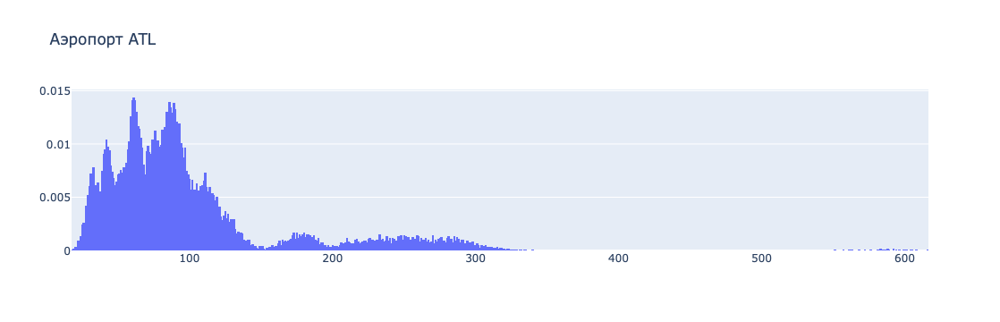

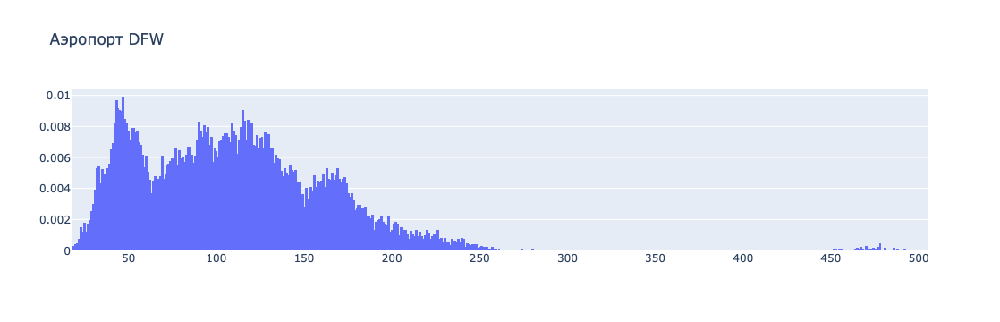

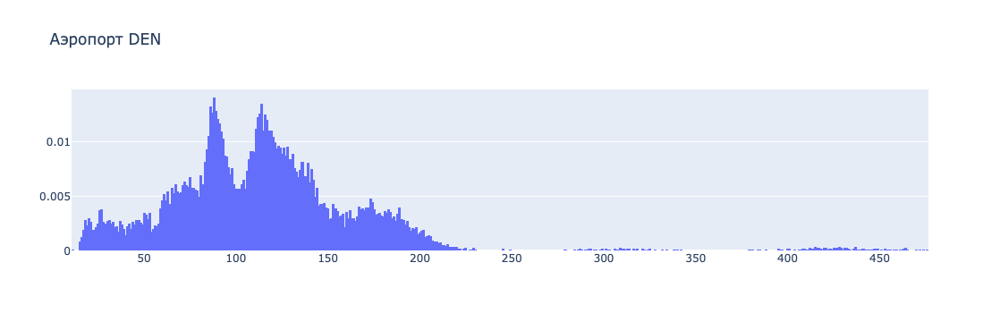

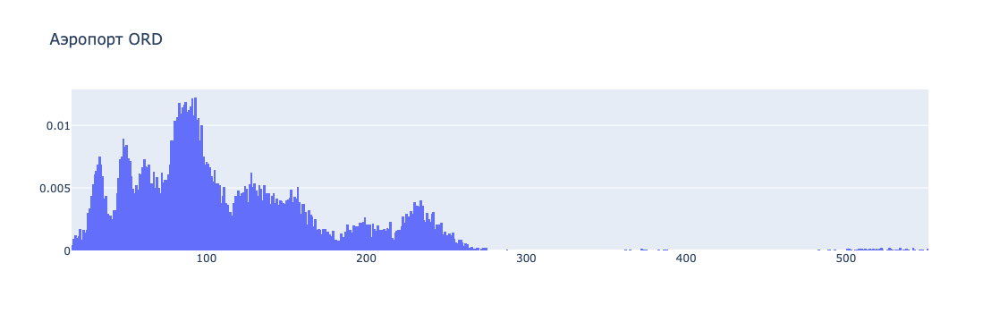

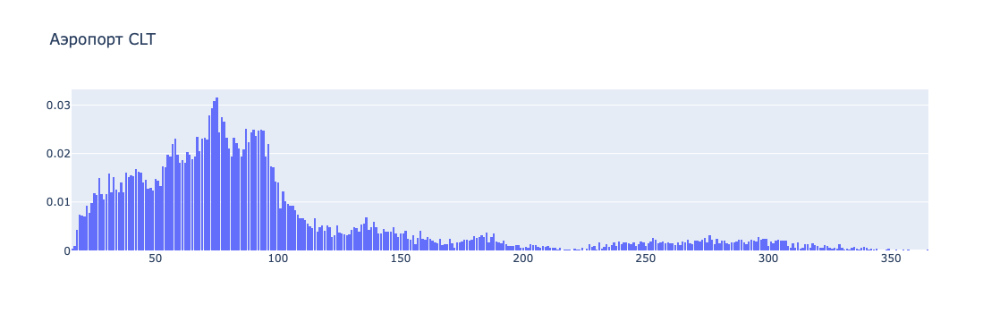

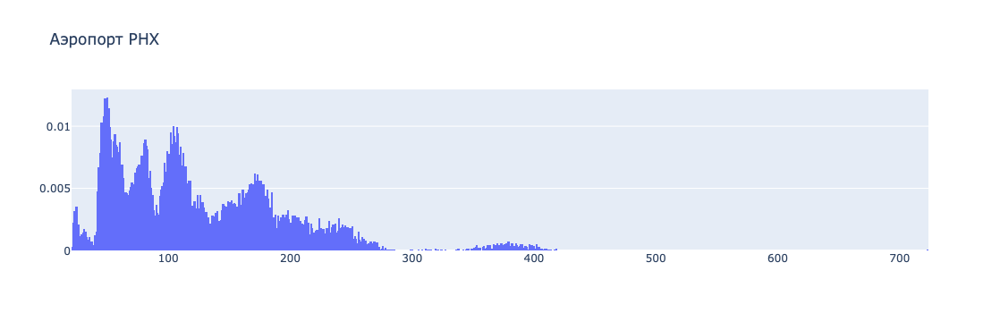

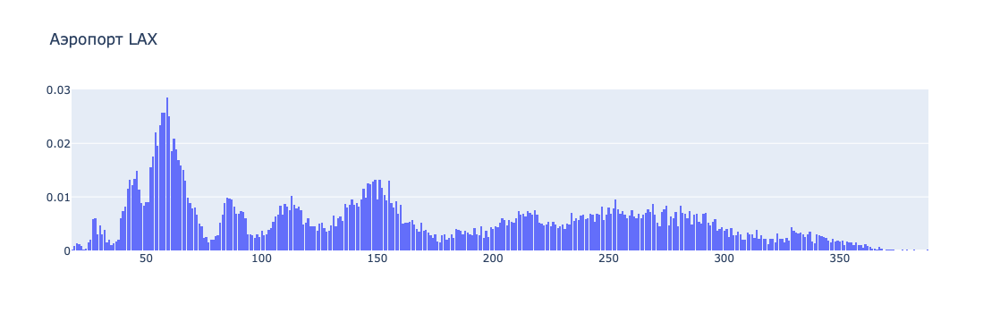

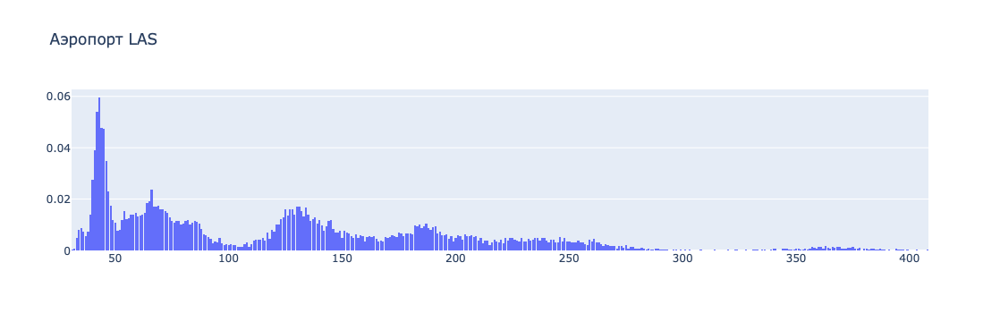

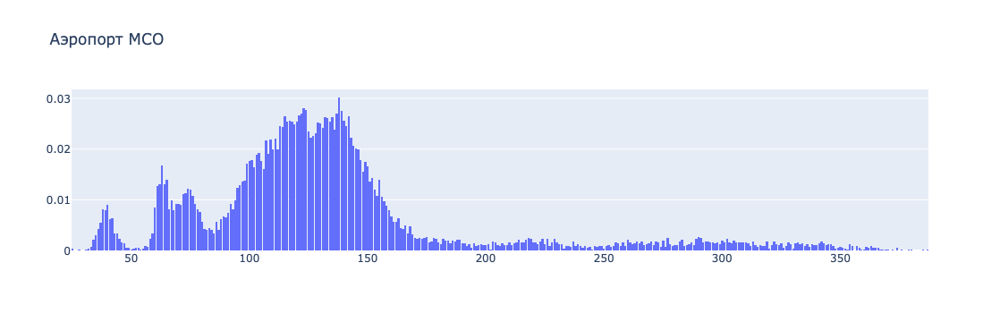

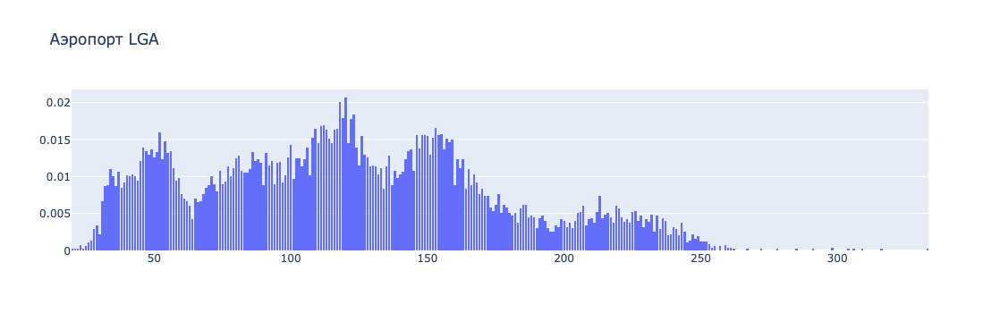

In [50]:
counter = 0

for values in flight_times_list:
    fig = go.Figure()

    fig.add_trace(go.Histogram(x=values, name=f'{top_10_airports[counter]}', opacity=1, nbinsx=800, histnorm='probability density'))

    fig.update_layout(title=f'Аэропорт {top_10_airports[counter]}')
    
    fig.show()

    counter += 1